Клининг для личных целей, генеральная уборка.
Регионы для анализа:
1.	Москва
2.	Санкт-Петербург
3.	Смоленская область


Основные приёмы, которые были использованы в работе:
1. Динамический парсинг с Selenium
2. Код сделан в формате ООП
3. Также были использованы данные РосСтат-а, в частности данный сервис: https://showdata.gks.ru/finder/descriptors/276926

Таблица там представлена в рублях и в процентах. Мною была использована та, что в рублях.

4-1. С сайта РосСтат-а были получены распределения Индекса физического объема бытовых услуг населению по Бытовым услугам населения (обощененные данные по регионам) и Прочим бытовым услугам (в частности клининг).

In [ ]:
import pandas as pd
from datetime import datetime

class ServiceDataProcessor:
    def __init__(self):
        self.df_household = pd.read_excel('Бытовые услуги.xlsx', header=None)
        self.df_other = pd.read_excel('Прочие бытовые услуги.xlsx', header=None)
        self.household_processed = None
        self.other_processed = None
        self.merged_df = None

    @staticmethod
    def parse_month(date_str):
        months = {
            'январь': 1, 'февраль': 2, 'март': 3, 'апрель': 4,
            'май': 5, 'июнь': 6, 'июль': 7, 'август': 8,
            'сентябрь': 9, 'октябрь': 10, 'ноябрь': 11, 'декабрь': 12
        }
        parts = date_str.strip().lower().split()
        return datetime(int(parts[1]), months[parts[0]], 1)

    def _process_single_df(self, df, service_type):
        months_row = self._find_months_row(df)
        months = self._extract_months(df, months_row)
        data = self._extract_region_data(df, months_row, months)
        return self._create_processed_df(data, months, service_type)

    def _find_months_row(self, df):
        return df[df.apply(lambda row: any('г.' in str(cell) for cell in row), axis=1)].index[0]

    def _extract_months(self, df, months_row):
        return [cell for cell in df.iloc[months_row, 2:]
                if isinstance(cell, str) and 'г.' in cell]

    def _extract_region_data(self, df, months_row, months):
        data = []
        for idx, row in df.iterrows():
            if idx > months_row and isinstance(row[0], str) and any(k in row[0] for k in ['область', 'округ']):
                values = [self._parse_value(x) for x in row[2:2+len(months)]]
                data.append([row[0].strip()] + values)
        return data

    def _parse_value(self, x):
        return float(str(x).replace(' ', '')) if str(x).strip() not in ('', '-', '—') else 0

    def _create_processed_df(self, data, months, service_type):
        df = pd.DataFrame(data, columns=['Регион'] + months)
        df.columns = [f'{col} ({service_type})' if col != 'Регион' else col for col in df.columns]
        return df

    def process_data(self):
        self.household_processed = self._process_single_df(self.df_household, 'бытовые')
        self.other_processed = self._process_single_df(self.df_other, 'прочие')

    def merge_and_finalize(self):
        self.merged_df = pd.merge(
            self.household_processed,
            self.other_processed,
            on='Регион',
            how='outer'
        ).fillna(0)

        self._reorder_columns()
        self._convert_numeric_types()

    def _reorder_columns(self):
        months = sorted({col.split(' (')[0] for col in self.merged_df if ' (' in col},
                       key=self.parse_month)
        new_columns = ['Регион']
        for m in months:
            new_columns.extend([f'{m} (бытовые)', f'{m} (прочие)'])
        self.merged_df = self.merged_df.reindex(columns=new_columns, fill_value=0)

    def _convert_numeric_types(self):
        numeric_cols = [col for col in self.merged_df.columns if col != 'Регион']
        self.merged_df[numeric_cols] = self.merged_df[numeric_cols].apply(
            pd.to_numeric, errors='coerce'
        ).fillna(0)

    def get_merged_data(self):
        return self.merged_df

processor = ServiceDataProcessor()
processor.process_data()
processor.merge_and_finalize()
merged = processor.get_merged_data()
merged

,Регион,январь 2017 г. (бытовые),январь 2017 г. (прочие),февраль 2017 г. (бытовые),февраль 2017 г. (прочие),март 2017 г. (бытовые),март 2017 г. (прочие),апрель 2017 г. (бытовые),апрель 2017 г. (прочие),май 2017 г. (бытовые),...,сентябрь 2024 г. (бытовые),сентябрь 2024 г. (прочие),октябрь 2024 г. (бытовые),октябрь 2024 г. (прочие),ноябрь 2024 г. (бытовые),ноябрь 2024 г. (прочие),декабрь 2024 г. (бытовые),декабрь 2024 г. (прочие),январь 2025 г. (бытовые),январь 2025 г. (прочие)
0,Амурская область,306659.20,9316.7,291988.39,8438.70,294361.70,7932.40,301314.2,7841.50,309784.70,...,556725.40,42681.6,577879.49,44166.60,566439.00,44171.1,626696.80,48075.9,590883.30,44631.30
1,Архангельская область,360426.60,36931.1,399142.90,38374.00,481760.60,45150.20,499071.4,37796.00,445960.80,...,1019321.30,53568.9,1064507.30,56191.60,1050528.50,54005.5,1101174.60,59729.4,1071782.20,56564.00
2,Архангельская область (кроме Ненецкого автоном...,342812.50,36642.4,381316.60,38053.19,462819.40,44829.40,479981.4,37475.20,426483.60,...,975358.19,52339.0,1017807.40,54937.70,1004160.40,52758.2,1053937.79,57792.2,1026167.69,54908.50
3,Астраханская область,248474.60,11697.9,245634.00,14494.00,285592.09,15016.80,230551.1,19506.00,234362.80,...,537314.10,39390.3,549557.80,40175.10,540118.69,37321.4,568281.10,43452.3,548652.90,41854.19
4,Белгородская область,1025229.80,87397.8,986920.69,4925.70,1057465.20,937.79,1061173.7,34173.50,1145627.89,...,1961530.40,53427.2,1904486.20,55663.70,2038353.69,54282.1,2176441.50,58534.7,2146638.10,55207.30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,Челябинская область,1356652.60,62268.1,1342774.20,64537.20,1357338.30,64373.50,1374109.3,62563.70,1372399.10,...,4161817.90,204588.7,4349687.30,216250.49,4321899.09,216817.7,4461397.50,242030.9,4266072.30,216090.80
59,Чукотский автономный округ,206862.20,592.7,117378.80,440.69,183369.90,410.29,75196.3,729.49,84373.50,...,50049.30,1209.2,51402.80,1420.40,49333.60,1073.4,51577.90,1403.0,49823.20,1121.09
60,Южный федеральный округ (с 29.07.2016),11131951.19,306865.7,10997351.60,316757.59,11116807.39,315345.70,11115901.8,305430.80,11385365.00,...,31266088.19,1556081.7,30670642.40,1590394.70,29500112.10,1579262.2,29917093.00,1637017.0,24921671.00,1419403.00
61,Ямало-Ненецкий автономный округ (Тюменская обл...,152433.60,4655.1,154246.00,4674.00,161043.60,7998.90,158510.8,7642.60,163701.70,...,391657.10,25124.5,415255.90,26663.70,411891.10,26999.6,431168.10,29391.5,408806.90,28028.00


Эти данные будут в дальнейшем исрользованы в анализе ЦА и построении её портрета

4.2 Получим координаты регионов на карте с помощью API Яндекс карт

In [ ]:
import re
import requests
from time import sleep
import pandas as pd

class GeoDataEnhancer:
    def __init__(self, merged_df, api_key):
        self.merged = merged_df
        self.API_KEY = api_key

    @staticmethod
    def _clean_region_name(region):
        return re.sub(r'\s*\(.*?\)', '', region).strip()

    def _build_geocode_url(self, region):
        return {
            "url": "https://geocode-maps.yandex.ru/1.x/",
            "params": {
                "apikey": self.API_KEY,
                "geocode": f"{region}, Россия",
                "format": "json",
                "lang": "ru-RU"
            }
        }

    def _handle_geocode_response(self, response):
        try:
            data = response.json()
            feature = data['response']['GeoObjectCollection']['featureMember']
            if feature:
                pos = feature[0]['GeoObject']['Point']['pos'].split()
                return float(pos[1]), float(pos[0])
        except (KeyError, IndexError, ValueError) as e:
            print(f"Ошибка обработки ответа: {str(e)}")
        return (None, None)

    def _get_coordinates(self, region):
        try:
            request_data = self._build_geocode_url(region)
            response = requests.get(**request_data)

            if response.status_code == 200:
                return self._handle_geocode_response(response)

            print(f"Ошибка HTTP: {response.status_code} для региона {region}")
            return (None, None)
        except Exception as e:
            print(f"Ошибка соединения для региона {region}: {str(e)}")
            return (None, None)

    def _update_geo_columns(self):
        self.merged[['Широта', 'Долгота']] = self.merged[['Широта', 'Долгота']].apply(
            pd.to_numeric, errors='coerce'
        )

    def _process_single_region(self, index, region):
        cleaned_region = self._clean_region_name(region)
        lat, lon = self._get_coordinates(cleaned_region)
        self.merged.at[index, 'Широта'] = lat
        self.merged.at[index, 'Долгота'] = lon
        sleep(0.3)

    def add_geo_data(self):
        self.merged['Широта'] = None
        self.merged['Долгота'] = None

        for index, row in self.merged.iterrows():
            self._process_single_region(index, row['Регион'])

        self._update_geo_columns()

    def show_results(self):
        print(self.merged[['Регион', 'Широта', 'Долгота']].head())

geo_enhancer = GeoDataEnhancer(merged, API_KEY)
geo_enhancer.add_geo_data()
geo_enhancer.show_results()

                                              Регион     Широта     Долгота
0                                   Амурская область  53.413346  127.728073
1                              Архангельская область  63.637521   43.336670
2  Архангельская область (кроме Ненецкого автоном...  63.637521   43.336670
3                               Астраханская область  46.851463   47.466198
4                               Белгородская область  50.872237   37.303207


Теперь мы получили точное географическое расположение нашей основной целевой аудитории. Теперь можно создать наиболее чёткое визуальное представление нашей ЦА, используя ранее полученные данные

  4.3 Составляем интерактивную карту для полученных координат регионов с динамикой по годам.

In [ ]:
import plotly.express as px
from datetime import datetime

class DataVisualizer:
    def __init__(self, merged_data):
        self.merged = merged_data
        self.melted = None
        self.fig = None
        self._month_translation = self._create_month_mapping()

    @staticmethod
    def _create_month_mapping():
        return {
            'январь': 'January', 'февраль': 'February', 'март': 'March',
            'апрель': 'April', 'май': 'May', 'июнь': 'June',
            'июль': 'July', 'август': 'August', 'сентябрь': 'September',
            'октябрь': 'October', 'ноябрь': 'November', 'декабрь': 'December'
        }

    def _clean_date_string(self, date_str):
        return date_str.split(' (')[0].strip().lower().replace(' г.', '')

    def _extract_date_components(self, clean_date):
        parts = clean_date.split()
        if len(parts) != 2:
            raise ValueError(f"Invalid date format: {clean_date}")
        return parts[0], parts[1]

    def _translate_month(self, month_ru):
        try:
            return self._month_translation[month_ru]
        except KeyError:
            raise ValueError(f"Unknown month: {month_ru}")

    def _parse_custom_date(self, date_str):
        try:
            clean_date = self._clean_date_string(date_str)
            month_ru, year = self._extract_date_components(clean_date)
            month_en = self._translate_month(month_ru)
            return datetime.strptime(f"{month_en} {year}", "%B %Y")
        except Exception as e:
            print(f"Date parsing error: {date_str} -> {str(e)}")
            return None

    def _melt_data(self):
        date_columns = [col for col in self.merged.columns if 'г.' in col]
        self.melted = self.merged.melt(
            id_vars=['Регион', 'Широта', 'Долгота'],
            value_vars=date_columns,
            var_name='Период',
            value_name='Объем'
        )

    def _add_date_column(self):
        self.melted['Дата'] = self.melted['Период'].apply(self._parse_custom_date)
        self.melted = self.melted.dropna(subset=['Дата']).sort_values('Дата')

    def _prepare_visualization_data(self):
        self._melt_data()
        self._add_date_column()

    def _get_figure_parameters(self):
        return {
            'data_frame': self.melted,
            'lat': 'Широта',
            'lon': 'Долгота',
            'size': 'Объем',
            'color': 'Регион',
            'animation_frame': 'Дата',
            'hover_name': 'Регион',
            'hover_data': {'Объем': ':.0f', 'Дата': '|%B %Y'},
            'zoom': 3,
            'height': 600,
            'title': 'Объем услуг по регионам России',
            'labels': {'Объем': 'Тысяч рублей'},
            'size_max': 40
        }

    def _configure_layout(self):
        self.fig.update_layout(
            mapbox_style="open-street-map",
            margin={"r":0, "t":40, "l":0, "b":0},
            transition={'duration': 500}
        )

    def create_visualization(self):
        self._prepare_visualization_data()
        fig_params = self._get_figure_parameters()
        self.fig = px.scatter_mapbox(**fig_params)
        self._configure_layout()

    def show(self):
        if self.fig:
            self.fig.show()
        else:
            print("Visualization not created yet. Call create_visualization() first.")

visualizer = DataVisualizer(merged)
visualizer.create_visualization()
visualizer.show()

Полученная карта дает общее представление по целевой аудитории, но её можно оценить более точно. Для начала взглянем на сформированные данные

In [ ]:
merged

,Регион,январь 2017 г. (бытовые),январь 2017 г. (прочие),февраль 2017 г. (бытовые),февраль 2017 г. (прочие),март 2017 г. (бытовые),март 2017 г. (прочие),апрель 2017 г. (бытовые),апрель 2017 г. (прочие),май 2017 г. (бытовые),...,октябрь 2024 г. (бытовые),октябрь 2024 г. (прочие),ноябрь 2024 г. (бытовые),ноябрь 2024 г. (прочие),декабрь 2024 г. (бытовые),декабрь 2024 г. (прочие),январь 2025 г. (бытовые),январь 2025 г. (прочие),Широта,Долгота
0,Амурская область,306659.20,9316.7,291988.39,8438.70,294361.70,7932.40,301314.2,7841.50,309784.70,...,577879.49,44166.60,566439.00,44171.1,626696.80,48075.9,590883.30,44631.30,53.413346,127.728073
1,Архангельская область,360426.60,36931.1,399142.90,38374.00,481760.60,45150.20,499071.4,37796.00,445960.80,...,1064507.30,56191.60,1050528.50,54005.5,1101174.60,59729.4,1071782.20,56564.00,63.637521,43.336670
2,Архангельская область (кроме Ненецкого автоном...,342812.50,36642.4,381316.60,38053.19,462819.40,44829.40,479981.4,37475.20,426483.60,...,1017807.40,54937.70,1004160.40,52758.2,1053937.79,57792.2,1026167.69,54908.50,63.637521,43.336670
3,Астраханская область,248474.60,11697.9,245634.00,14494.00,285592.09,15016.80,230551.1,19506.00,234362.80,...,549557.80,40175.10,540118.69,37321.4,568281.10,43452.3,548652.90,41854.19,46.851463,47.466198
4,Белгородская область,1025229.80,87397.8,986920.69,4925.70,1057465.20,937.79,1061173.7,34173.50,1145627.89,...,1904486.20,55663.70,2038353.69,54282.1,2176441.50,58534.7,2146638.10,55207.30,50.872237,37.303207
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,Челябинская область,1356652.60,62268.1,1342774.20,64537.20,1357338.30,64373.50,1374109.3,62563.70,1372399.10,...,4349687.30,216250.49,4321899.09,216817.7,4461397.50,242030.9,4266072.30,216090.80,54.446204,60.395650
59,Чукотский автономный округ,206862.20,592.7,117378.80,440.69,183369.90,410.29,75196.3,729.49,84373.50,...,51402.80,1420.40,49333.60,1073.4,51577.90,1403.0,49823.20,1121.09,65.982613,174.432320
60,Южный федеральный округ (с 29.07.2016),11131951.19,306865.7,10997351.60,316757.59,11116807.39,315345.70,11115901.8,305430.80,11385365.00,...,30670642.40,1590394.70,29500112.10,1579262.2,29917093.00,1637017.0,24921671.00,1419403.00,48.622564,43.166160
61,Ямало-Ненецкий автономный округ (Тюменская обл...,152433.60,4655.1,154246.00,4674.00,161043.60,7998.90,158510.8,7642.60,163701.70,...,415255.90,26663.70,411891.10,26999.6,431168.10,29391.5,408806.90,28028.00,67.808603,75.199571


Таким образом, округа, на которые стоит обратить внимание- это Центральный, Приволжский и Южный

4.4 Для более четкого понимания ЦА, составим топ самых платежеспособных регионов, собрав города, находящиеся в них с помощью таблицы городов и регионов (https://github.com/hflabs/city/)

In [ ]:
!pip install fuzzywuzzy
import pandas as pd
import re
from fuzzywuzzy import fuzz, process

class CityDataProcessor:
    def __init__(self, merged_df):
        self.merged = merged_df
        self.city_df = pd.read_csv('city.csv', dtype={'population': float})
        self.matched_regions = {}
        self.city_processed = None
        self.final_df = None
        self.melted = None
        self.result = None

        self._initialize_data_processing()

    @staticmethod
    def _clean_region_name(name):
        name = re.sub(r'\(.*?\)', '', name)
        patterns = [
            (r'\s*федеральный округ', ''),
            (r'\s*область', ''),
            (r'\s*край', ''),
            (r'\s*республика', '')
        ]
        for pattern, replacement in patterns:
            name = re.sub(pattern, replacement, name, flags=re.I)
        return name.strip()

    def _prepare_base_data(self):
        self.merged['clean_region'] = self.merged['Регион'].apply(self._clean_region_name)
        self.city_df['clean_region'] = self.city_df['region'].apply(self._clean_region_name)

    def _find_best_match(self, region):
        return process.extractOne(
            region,
            self.city_df['clean_region'].unique(),
            scorer=fuzz.token_sort_ratio
        )

    def _perform_fuzzy_matching(self):
        regions_to_match = self.merged['clean_region'].unique()
        for region in regions_to_match:
            match = self._find_best_match(region)
            if match[1] > 85:
                self.matched_regions[region] = match[0]

    def _prepare_main_cities(self):
        return (self.city_df.sort_values('population', ascending=False)
                  .groupby('clean_region')
                  .first()
                  .reset_index())

    def _aggregate_population(self):
        return (self.city_df.groupby('clean_region')['population']
                  .sum()
                  .reset_index()
                  .rename(columns={'population': 'region_population'}))

    def _process_city_data(self):
        main_cities = self._prepare_main_cities()
        population = self._aggregate_population()
        self.city_processed = main_cities.merge(population, on='clean_region')
        self.city_df['population'] = self.city_df['population'].fillna(0)

    def _merge_datasets(self):
        self.final_df = self.merged.merge(
            self.city_processed[['clean_region', 'city', 'population', 'region_population']],
            on='clean_region',
            how='left'
        )

    def _melt_data(self):
      date_columns = [col for col in self.merged.columns if 'г.' in col]
      self.melted = self.final_df.melt(
          id_vars=['Регион', 'city', 'region_population', 'population', 'Широта', 'Долгота'],  # Добавлено population
          value_vars=date_columns,
          var_name='period',
          value_name='value'
      )

    def _split_period_column(self):
        self.melted[['month_year', 'service_type']] = (
            self.melted['period']
            .str.extract(r'(.+ г.) \((.+)\)')
        )

    @staticmethod
    def _calculate_row_expense(row):
        if pd.isna(row['region_population']) or row['region_population'] == 0:
            return 0

        city_population = row.get('population', 0)

        return (row['value'] * 1000 * city_population) / row['region_population']

    def _calculate_expenses(self):
      self.melted['expense'] = self.melted.apply(self._calculate_row_expense, axis=1)

    def _clean_result_data(self):
        self.result = self.melted[[
            'Регион', 'city', 'month_year', 'service_type',
            'value', 'expense', 'Широта', 'Долгота'
        ]].sort_values(['Регион', 'month_year'])

        self.result['expense'] = self.result.apply(
            lambda x: round(x['expense'], 2) if x['expense'] != 0 else 0,
            axis=1
        )
        self.result['city'] = self.result['city'].fillna('Неизвестно')
        self.result = self.result.loc[~((self.result['value'] == 0) & (self.result['expense'] == 0))]
        self.result = self.result.dropna(subset=['value', 'expense'], how='all')
        self.result = self.result.reset_index(drop=True)

    def _initialize_data_processing(self):
        self._prepare_base_data()
        self._perform_fuzzy_matching()
        self._process_city_data()
        self._merge_datasets()
        self._melt_data()
        self._split_period_column()
        self._calculate_expenses()
        self._clean_result_data()

    def get_result(self):
        return self.result

city_processor = CityDataProcessor(merged)
result = city_processor.get_result()
result


<ipython-input-66-1af141baf816>:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



,Регион,city,month_year,service_type,value,expense,Широта,Долгота
0,Амурская область,Благовещенск,август 2017 г.,бытовые,331883.10,1.515895e+08,53.413346,127.728073
1,Амурская область,Благовещенск,август 2017 г.,прочие,7873.49,3.596261e+06,53.413346,127.728073
2,Амурская область,Благовещенск,август 2018 г.,бытовые,305584.60,1.395775e+08,53.413346,127.728073
3,Амурская область,Благовещенск,август 2018 г.,прочие,10017.40,4.575504e+06,53.413346,127.728073
4,Амурская область,Благовещенск,август 2019 г.,бытовые,328284.90,1.499460e+08,53.413346,127.728073
...,...,...,...,...,...,...,...,...
11823,Ярославская область,Ярославль,январь 2023 г.,прочие,17687.59,1.053890e+07,57.817361,39.105138
11824,Ярославская область,Ярославль,январь 2024 г.,бытовые,886518.90,5.282195e+08,57.817361,39.105138
11825,Ярославская область,Ярославль,январь 2024 г.,прочие,27751.10,1.653509e+07,57.817361,39.105138
11826,Ярославская область,Ярославль,январь 2025 г.,бытовые,994407.69,5.925035e+08,57.817361,39.105138


Собираем топ городов

In [ ]:
import pandas as pd

class PurchaseCapacityAnalyzer:
    def __init__(self, result_df):
        self.result = result_df.copy()
        self._month_translation = self._create_month_mapping()
        self.city_stats = None

        self._initialize_processing()

    @staticmethod
    def _create_month_mapping():
        return {
            'январь': 'January', 'февраль': 'February', 'март': 'March',
            'апрель': 'April', 'май': 'May', 'июнь': 'June', 'июль': 'July',
            'август': 'August', 'сентябрь': 'September', 'октябрь': 'October',
            'ноябрь': 'November', 'декабрь': 'December'
        }

    def _rename_columns(self):
        column_mapping = {'Дата': 'date', 'Период': 'period', 'Город': 'city'}
        self.result.rename(columns=column_mapping, inplace=True)

    def _clean_month_year_string(self):
        self.result['month_year'] = self.result['month_year'].str.replace(' г.', '', regex=False)

    @staticmethod
    def _translate_month(date_str, translation_map):
        for ru_month, en_month in translation_map.items():
            if ru_month in date_str.lower():
                return date_str.replace(ru_month, en_month)
        return date_str

    def _convert_to_datetime(self):
        self.result['date'] = pd.to_datetime(
            self.result['month_year'].apply(lambda x: self._translate_month(x, self._month_translation)),
            format='%B %Y',
            errors='coerce'
        )

    def _calculate_time_metrics(self):
        base_date = pd.to_datetime('2017-01-01')
        max_date = pd.to_datetime('2025-01-01')
        total_months = (max_date.year - base_date.year) * 12 + (max_date.month - base_date.month)

        self.result['months_from_base'] = (
            (self.result['date'].dt.year - base_date.year) * 12 +
            (self.result['date'].dt.month - base_date.month)
        )
        self.result['weight'] = 1 + (self.result['months_from_base'] / total_months * 1.5)

    def _calculate_weighted_expense(self):
        self.result['weighted_expense'] = self.result['expense'] * self.result['weight']

    def _perform_aggregation(self):
        aggregation_rules = {
            'weighted_expense': 'mean',
            'expense': ['sum', 'mean'],
            'date': lambda x: (x.max() - x.min()).days
        }

        self.city_stats = self.result.groupby('city', as_index=False).agg(aggregation_rules)
        self._flatten_column_names()

    def _flatten_column_names(self):
        self.city_stats.columns = [
            'city',
            'weighted_capacity',
            'total_expense',
            'avg_expense',
            'data_coverage_days'
        ]

    def _filter_and_sort_results(self):
        self.city_stats = self.city_stats[
            (self.city_stats['data_coverage_days'] >= 2000) &
            (self.city_stats['avg_expense'] > 0)
        ].sort_values('weighted_capacity', ascending=False)

    def _format_final_output(self):
        self.city_stats['weighted_capacity'] = self.city_stats['weighted_capacity'].round(2)
        self.city_stats['total_expense'] = self.city_stats['total_expense'].apply(
            lambda x: f"{x/1e6:.1f}M"
        )

    def _initialize_processing(self):
        self._rename_columns()
        self._clean_month_year_string()
        self._convert_to_datetime()
        self.result = self.result.dropna(subset=['date'])
        self._calculate_time_metrics()
        self._calculate_weighted_expense()
        self._perform_aggregation()
        self._filter_and_sort_results()
        self._format_final_output()

    def analyze(self):
        self._convert_to_datetime()
        self._calculate_time_metrics()
        self._calculate_weighted_expense()
        self._perform_aggregation()
        self._filter_and_sort_results()
        self._format_final_output()


    def print_top_cities(self):
        print("Топ-10 городов по покупательной способности:")
        display(self.city_stats[['city', 'weighted_capacity', 'total_expense']].head(10))

analyzer = PurchaseCapacityAnalyzer(result)
analyzer.print_top_cities()


Топ-10 городов по покупательной способности:


,city,weighted_capacity,total_expense
32,Ростов-на-Дону,1.966753e+09,201924.9M
26,Новосибирск,1.652655e+09,162045.2M
27,Омск,1.276686e+09,132689.4M
9,Воронеж,1.269585e+09,137344.3M
11,Екатеринбург,1.196230e+09,127510.1M
24,Нижний Новгород,1.129537e+09,116524.4M
41,Тюмень,1.037963e+09,213667.3M
43,Челябинск,9.906220e+08,100491.6M
8,Волгоград,9.840129e+08,103484.5M
34,Самара,7.137059e+08,73213.4M


Видим, что самые платёжеспособные- это Ростов-на-Дону, Новосибирск и Омск

4.5 Получаем ключевые графики по городам с самой высокой покупательной способностью

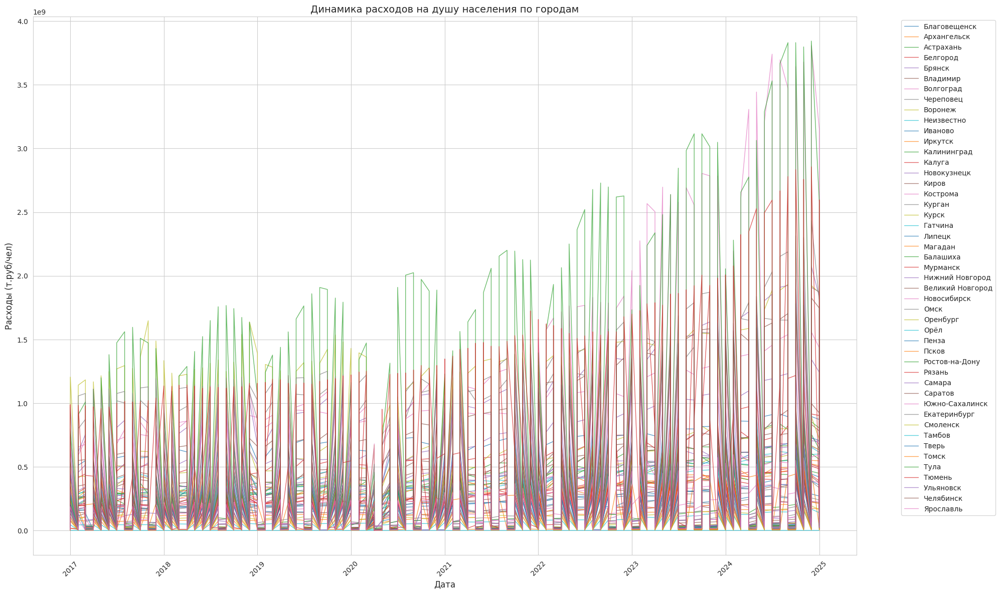

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

class ExpenseDynamicsPlotter:
    def __init__(self, result_data):
        self.result = result_data
        self.fig = None
        self.ax = None
        self._validate_data()

    def _validate_data(self):
        """Проверка наличия необходимых колонок и преобразование month_year в datetime"""
        required_columns = ['month_year', 'city', 'expense']
        missing = [col for col in required_columns if col not in self.result.columns]
        if missing:
            raise KeyError(f"Missing required columns: {', '.join(missing)}")

        if 'date' not in self.result.columns:
            self._convert_month_year()

    def _convert_month_year(self):
        month_translation = {
            'январь': 'January', 'февраль': 'February', 'март': 'March',
            'апрель': 'April', 'май': 'May', 'июнь': 'June', 'июль': 'July',
            'август': 'August', 'сентябрь': 'September', 'октябрь': 'October',
            'ноябрь': 'November', 'декабрь': 'December'
        }

        def _parse_date(date_str):
            try:
                ru_month, year = date_str.replace(' г.', '').split()
                return pd.to_datetime(f"{month_translation[ru_month.lower()]} {year}", format='%B %Y')
            except Exception as e:
                print(f"Ошибка парсинга даты: {date_str} -> {str(e)}")
                return pd.NaT

        self.result['date'] = self.result['month_year'].apply(_parse_date)
        self.result = self.result.dropna(subset=['date'])

    def _setup_plot_environment(self):
        self.fig = plt.figure(figsize=(20, 12))
        sns.set_style("whitegrid")
        self.ax = self.fig.add_subplot(111)

    def _plot_individual_cities(self):
        for city in self.result['city'].unique():
            city_data = self.result[self.result['city'] == city].sort_values('date')
            self.ax.plot(
                'date',
                'expense',
                data=city_data,
                label=city,
                linewidth=1,
                alpha=0.7
            )

    def _configure_plot_appearance(self):
        self.ax.set_title('Динамика расходов на душу населения по городам', fontsize=14)
        self.ax.set_xlabel('Дата', fontsize=12)
        self.ax.set_ylabel('Расходы (т.руб/чел)', fontsize=12)
        self.ax.tick_params(axis='x', rotation=45)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()

    def plot_dynamics(self):
        self._setup_plot_environment()
        self._plot_individual_cities()
        self._configure_plot_appearance()
        plt.show()

analyzer = PurchaseCapacityAnalyzer(result)
analyzer.analyze()

processed_data = analyzer.result

plotter = ExpenseDynamicsPlotter(processed_data)
plotter.plot_dynamics()

Комментарий по графику:
С каждым годом доходы жителей становятся всё больше, из-за чего увеличивается их покупательная способность. Жители с наибольшей покупательной способностью находятся в Ростове-на-Дону, Московской области, Твери, Воронеже, Курске и Ярославле. Из этого можно сделать вывод, что эти группы горожан наиболее часто могут себе позволить услуги генеральной уборки клининговых компаний, что совпадает с данными, полученныии ранее.


А также динамическую карту

In [ ]:
import plotly.express as px
import pandas as pd
from datetime import datetime

class ExpenseDynamicsVisualizer:
    def __init__(self, result_data):
        self.result = result_data
        self.processed_data = None
        self.fig = None
        self._month_translation = self._create_month_mapping()
        self._prepare_data()

    @staticmethod
    def _create_month_mapping():
        return {
            'январь': 'January', 'февраль': 'February', 'март': 'March',
            'апрель': 'April', 'май': 'May', 'июнь': 'June',
            'июль': 'July', 'август': 'August', 'сентябрь': 'September',
            'октябрь': 'October', 'ноябрь': 'November', 'декабрь': 'December'
        }

    def _parse_date(self, date_str):
        try:
            clean_date = date_str.replace(' г.', '').strip().lower()
            month_ru, year = clean_date.split()
            month_en = self._month_translation[month_ru]
            return datetime.strptime(f"{month_en} {year}", "%B %Y")
        except Exception as e:
            print(f"Ошибка преобразования даты: {date_str} -> {str(e)}")
            return None

    def _prepare_data(self):
        self.result['date'] = self.result['month_year'].apply(self._parse_date)
        self.processed_data = self.result.dropna(subset=['date'])
        self.processed_data.sort_values('date', inplace=True)

    def _create_animation(self):
        self.fig = px.scatter_mapbox(
            self.processed_data,
            lat='Широта',
            lon='Долгота',
            size='expense',
            color='city',
            animation_frame='date',
            hover_name='city',
            hover_data={
                'date': '|%B %Y',
                'expense': ':.2f',
                'Широта': False,
                'Долгота': False
            },
            zoom=3,
            height=600,
            title='Динамика расходов по городам России',
            labels={'expense': 'Руб/чел'},
            size_max=40
        )

    def _configure_layout(self):
        self.fig.update_layout(
            mapbox_style="open-street-map",
            margin={"r":0, "t":40, "l":0, "b":0},
            transition={'duration': 500}
        )

    def create_visualization(self):
        self._create_animation()
        self._configure_layout()

    def show(self):
        if self.fig:
            self.fig.show()
        else:
            print("Сначала создайте визуализацию через метод create_visualization()")

analyzer = PurchaseCapacityAnalyzer(result)
analyzer.analyze()
processed_data = analyzer.result

visualizer = ExpenseDynamicsVisualizer(processed_data)
visualizer.create_visualization()
visualizer.show()

Комментарий к карте: Получили наглядную информацию о регионах с самой сильной покупательной способностью, на которых можно в дальнейшем сконцетрировать развитие бизнеса.

5.1 Для полученных городов парсим Яндекс услуги по разделу клининга, чтобы определить средние цены на услуги в регионах

In [ ]:
import requests
from bs4 import BeautifulSoup
import time
from selenium.webdriver.common.by import By
from selenium.common.exceptions import NoSuchElementException
import undetected_chromedriver as uc

# Страница с каталогом городов статическая, поэтому её попыталась спарсить requests
def get_city_links():
    url = 'https://uslugi.yandex.ru/geo-catalog'
    response = requests.get(url)
    cities = []

    if response.status_code == 200:
        soup = BeautifulSoup(response.text, 'html.parser')
        links = soup.find_all('a', class_='Link GeoObjectsList-Item')

        for link in links:
            city_name = link.find('span', class_='TextCut-Text').text.strip()
            city_url = link['href']
            cities.append({'city': city_name, 'url': city_url})

    # И только если список пустой, использовала Selenium
    if not cities:
        driver = uc.Chrome()
        driver.get(url)
        time.sleep(5)
        soup = BeautifulSoup(driver.page_source, 'html.parser')
        links = soup.find_all('a', class_='Link GeoObjectsList-Item')

        for link in links:
            city_name = link.find('span', class_='TextCut-Text').text.strip()
            city_url = link['href']
            cities.append({'city': city_name, 'url': city_url})
        driver.quit()

    return cities

top_cities_list = city_stats['city'].tolist()

def normalize_name(name):
    return name.lower().replace(' ', '-').replace('ё', 'е')

city_links = get_city_links()
filtered_cities = []

for city in city_links:
    normalized = normalize_name(city['city'])
    for top_city in top_cities_list:
        if normalize_name(top_city) == normalized:
            filtered_cities.append({
                'city': top_city,
                'url': city['url']
            })
            break

class Browser:
    def __init__(self):
        self.driver = None

    def initialize_browser(self):
        self.driver = uc.Chrome()
        self.driver.implicitly_wait(10)

    def get_driver(self):
        return self.driver

    def close_browser(self):
        if self.driver:
            self.driver.quit()
    """
    Каптчу пришлось решать руками, т.к. для яндекса существующие решения платные
    При этом за парсинг мне пришлось решить её только один раз,
    т.к. использовался undetected_chromedriver и ожидание между страницами
    """
    def handle_captcha(self):
        try:
            captcha = self.driver.find_element(By.CLASS_NAME, 'CheckboxCaptcha')
            if captcha:
                print("НУЖНО РЕШИТЬ КАПТЧУ!")
                time.sleep(20)
                self.driver.refresh()
                return self.handle_captcha()
        except NoSuchElementException:
            pass

    def scrape_services(self, city_data):
        city_name = city_data['city']
        base_url = f"https://uslugi.yandex.ru/{city_data['url'].strip('/')}/category?p="
        services = []

        for page in range(1, 6):
            self.driver.get(f"{base_url}{page}&text=клининг")
            self.handle_captcha()
            time.sleep(3)

            try:
                cards = self.driver.find_elements(By.CLASS_NAME, 'WorkerCard')
                for card in cards:
                    try:
                        title = card.find_element(By.CLASS_NAME, 'WorkerCard-ServiceTitle').text
                        price = card.find_element(By.CLASS_NAME, 'WorkerCard-Price').text

                        price_clean = re.sub(r'\s+', ' ', price).strip()
                        match = re.match(r'([от]*\s*[\d\s]+)\s*([а-яё]+)\s?[/]?\s?([а-яё\s.]+)?', price_clean)

                        if match:
                            cost = match.group(1).strip()
                            currency = match.group(2).strip()
                            unit = match.group(3).strip() if match.group(3) else 'услуга'
                        else:
                            cost = price_clean
                            currency = ''
                            unit = ''

                        services.append({
                            'Город': city_name,
                            'Услуга': title,
                            'Стоимость': cost,
                            'Валюта': currency,
                            'Единица': unit
                        })
                    except Exception as e:
                        print(f"Ошибка при парсинге карточки: {e}")
            except Exception as e:
                print(f"Ошибка на странице {page}: {e}")

            time.sleep(2) # Немного ожидаем чтобы не вылезала каптча

        return services

browser = Browser()
browser.initialize_browser()

all_services = []
for city in filtered_cities:
    print(f"Обрабатываю город: {city['city']}")
    try:
        services = browser.scrape_services(city)
        all_services.extend(services)
    except Exception as e:
        print(f"Ошибка при обработке города {city['city']}: {e}")

browser.close_browser()

result_df = pd.DataFrame(all_services)
result_df.to_csv('yandex_services.csv', index=False)

так как Google Collab не поддерживает Selenium и тем более undetected chromedriver, то скрипт запускался локально. Результат подгружаем сюда

In [ ]:
df = pd.read_csv('yandex_services.csv')
df

,Город,Услуга,Стоимость
0,Волгоград,Уборка квартиры,от 1500 ₽
1,Волгоград,Уборка квартиры,от 30 ₽ / метр
2,Волгоград,Уборка квартиры,от 50 ₽ / м²
3,Волгоград,Уборка квартиры,по договорённости
4,Волгоград,Уборка квартиры,от 2000 ₽
...,...,...,...
401,Тюмень,Уборка квартиры,от 1500 ₽
402,Тюмень,Уборка квартиры,по договорённости
403,Тюмень,Уборка квартиры,2000 ₽
404,Тюмень,Уборка квартиры,по договорённости


В полученной таблице можно заметить, что существует несколько основных видов оплаты: по договоренности, фиксированная и за кв.м. Отфильтруем услуги и цены, распределив услуги на "Уборка квартиры" и "Уборка после ремонта", а остальные либо сметчив, либо удалив, а все цены преобразуем в фиксированные (предполагаем, что средняя площадь квартиры 50 кв. м.), затем построим графики

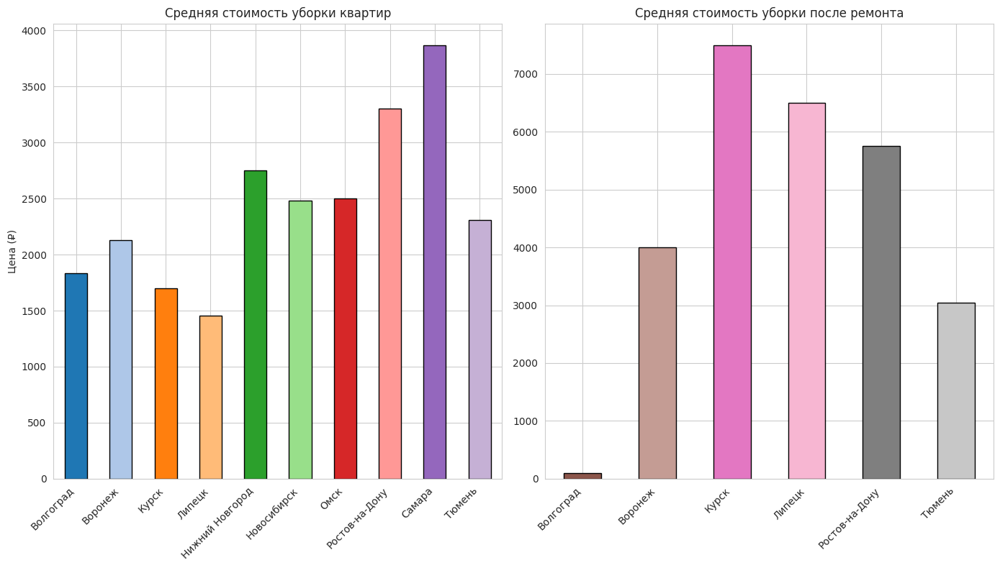

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import re

class DataProcessor:
    def __init__(self, df, service_mapping):
        self.df = df
        self.service_mapping = service_mapping

    def process_data(self):
        self._replace_service_names()
        self._filter_services()
        self._remove_negotiated_prices()
        self._add_fixed_price()
        return self.df

    def _replace_service_names(self):
        for pattern, replacement in self.service_mapping.items():
            self.df['Услуга'] = self.df['Услуга'].str.replace(pattern, replacement, regex=True)

    def _filter_services(self):
        self.df = self.df[self.df['Услуга'].isin(['Уборка квартиры', 'Уборка после ремонта'])]

    def _remove_negotiated_prices(self):
        self.df = self.df[self.df['Стоимость'] != 'по договорённости']

    def _add_fixed_price(self):
        self.df['Фиксированная цена'] = self.df.apply(self._process_price_row, axis=1)

    @staticmethod
    def _process_price_row(row):
        price = row['Стоимость']
        num = re.search(r'\d+[\s\d]*', price.replace(' ', '')).group()
        value = int(num) if num else 0
        if any(x in price for x in ['/ м²', '/ метр']):
            return value * 50
        return value

class DataVisualizer:
    def __init__(self, df):
        self.df = df
        self.colors = plt.cm.tab20.colors

    def create_plots(self):
        plt.figure(figsize=(14, 8))

        self._create_apartment_plot()
        self._create_renovation_plot()

        plt.tight_layout()
        plt.show()

    def _create_apartment_plot(self):
        plt.subplot(1, 2, 1)
        df_uborka = self.df[self.df['Услуга'] == 'Уборка квартиры']
        city_prices = df_uborka.groupby('Город')['Фиксированная цена'].mean()
        city_prices.plot(kind='bar', color=self.colors[:10], edgecolor='black')
        plt.title('Средняя стоимость уборки квартир')
        plt.xlabel('')
        plt.ylabel('Цена (₽)')
        plt.xticks(rotation=45, ha='right')

    def _create_renovation_plot(self):
        plt.subplot(1, 2, 2)
        df_remont = self.df[self.df['Услуга'] == 'Уборка после ремонта']
        city_prices_remont = df_remont.groupby('Город')['Фиксированная цена'].mean()
        city_prices_remont.plot(kind='bar', color=self.colors[10:], edgecolor='black')
        plt.title('Средняя стоимость уборки после ремонта')
        plt.xlabel('')
        plt.xticks(rotation=45, ha='right')

service_mapping = {
    r'Ежедневная уборка': 'Уборка квартиры',
    r'Поддерживающая уборка': 'Уборка квартиры',
    r'Клининг$': 'Уборка квартиры',
    r'Клининг, уборка квартир после ремонта': 'Уборка после ремонта',
    r'Уборка нежилого помещения': 'Уборка после ремонта'
}

processor = DataProcessor(df, service_mapping)
df = processor.process_data()

visualizer = DataVisualizer(df)
visualizer.create_plots()

Комментарий по графику:
Можем заметить, что стоимость услуги генеральной уборки выше после ремонта. Больше всего платят за клининг в Самаре, Ростове-на-Дону, Курске и Липецке. Так как Ростов-на-Дону, как было выяснено ранее, платежеспососбный город, в нём можно оставить всё, как есть. В других городах стоит снизить цены для повышения спроса, ведь таким образом наша ЦА станет еще больше.